In [1]:
import pandas as pd
import os
import json
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# Define paths
photo_path = "C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos"
#photos_json_path = "C:/Users/moksh/Downloads/Yelp-Photos/Yelp Photos/yelp_photos/photos.json"  # Adjust the path to your JSON file

# Load JSON data (replace this with the actual JSON structure)
photos_df = pd.read_json('photos.json', lines=True)

# Inspect the first few rows
print(photos_df.head())

                 photo_id             business_id  \
0  zsvj7vloL4L5jhYyPIuVwg  Nk-SJhPlDBkAZvfsADtccA   
1  HCUdRJHHm_e0OCTlZetGLg  yVZtL5MmrpiivyCIrVkGgA   
2  vkr8T0scuJmGVvN2HJelEA  _ab50qdWOk0DdB6XOrBitw   
3  pve7D6NUrafHW3EAORubyw  SZU9c8V2GuREDN5KgyHFJw   
4  H52Er-uBg6rNrHcReWTD2w  Gzur0f0XMkrVxIwYJvOt2g   

                                             caption    label  
0  Nice rock artwork everywhere and craploads of ...   inside  
1                                                     outside  
2                                     oyster shooter    drink  
3                                      Shrimp scampi     food  
4                                                        food  


In [3]:
photos_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   photo_id     200100 non-null  object
 1   business_id  200100 non-null  object
 2   caption      200100 non-null  object
 3   label        200100 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


In [5]:
photos_df['label' ].unique() 

array(['inside', 'outside', 'drink', 'food', 'menu'], dtype=object)

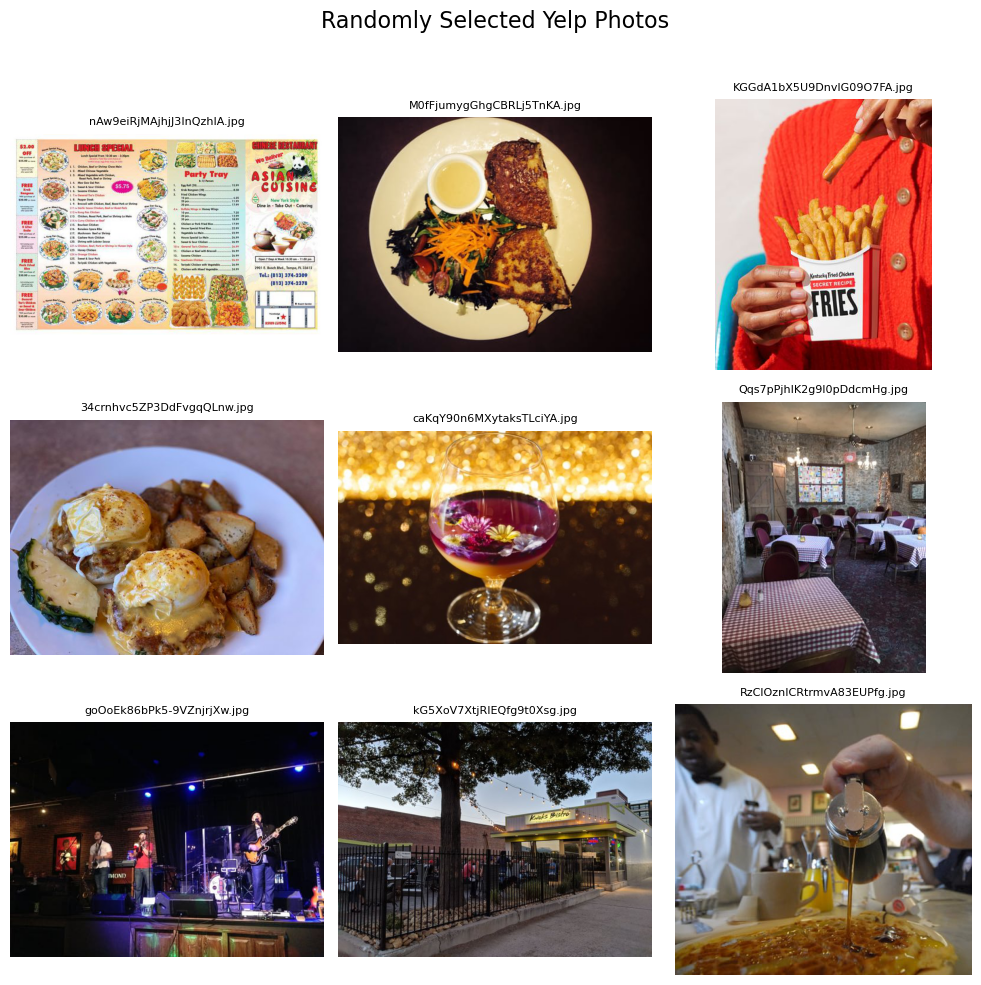

In [7]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Path to the folder containing the photos
#photos_folder = 'C:/Users/rinua/Downloads/Yelp-Photos/Yelp Photos/yelp_photos/photos'

# Get a list of all files in the folder
all_photos = os.listdir(photo_path)

# Filter out non-image files (optional, if needed)
image_files = [f for f in all_photos if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 9 random images from the list
selected_photos = random.sample(image_files, 9)

# Create a 3x3 grid to display images
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle("Randomly Selected Yelp Photos", fontsize=16)

# Loop through the selected photos and display them
for i, photo in enumerate(selected_photos):
    # Get the full path of the image
    img_path = os.path.join(photo_path, photo)
    img = Image.open(img_path)  # Open the image
    
    # Calculate the row and column to place the image in
    row, col = divmod(i, 3)
    
    # Display the image
    axes[row, col].imshow(img)
    axes[row, col].axis('off')  # Hide axes
    axes[row, col].set_title(photo, fontsize=8)  # Set the title of the image

# Adjust layout to prevent overlap of titles and images
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot with the images
plt.show()

### Looking at class distribution

C:\Users\srida\AppData\Local\Temp\ipykernel_16964\447046137.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab20", len(label_counts))  # Using a colormap (tab20) for distinct colors


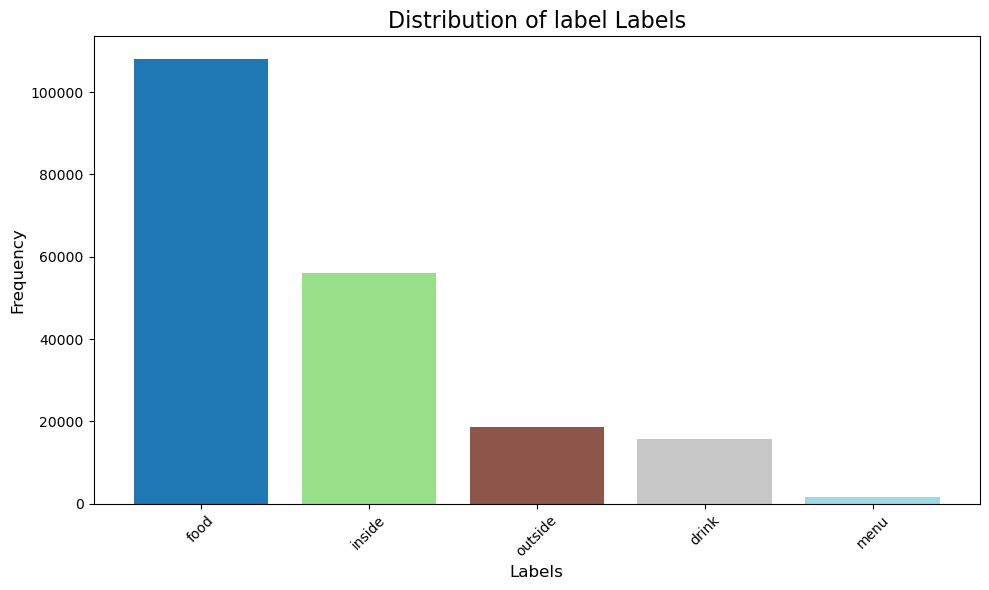

In [9]:
# Check the column names to identify the labels (assuming the column is named 'label' or similar)
if 'category' in photos_df.columns:
    label_column = 'category'
elif 'label' in photos_df.columns:
    label_column = 'label'
else:
    raise ValueError("The JSON file does not contain a label column.")

# Count the occurrences of each label
label_counts = photos_df[label_column].value_counts()

# Generate a list of unique colors (one for each bar)
colors = plt.cm.get_cmap("tab20", len(label_counts))  # Using a colormap (tab20) for distinct colors
color_list = [colors(i) for i in range(len(label_counts))]

# Plot the label distribution with different colors for each bar
plt.figure(figsize=(10, 6))
bars = plt.bar(label_counts.index, label_counts.values, color=color_list)

# Add title and labels
plt.title(f"Distribution of {label_column} Labels", fontsize=16)
plt.xlabel("Labels", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

### Creating a Train-Test split

In [12]:
from sklearn.model_selection import train_test_split

# Stratified split to keep label distribution, 10% sampled data
sampled_data_df, _ = train_test_split(photos_df, test_size=0.9, stratify=photos_df['label'])

# Convert sampled data to list of dicts with photo_id and label
sampled_data_list = sampled_data_df[['photo_id', 'label']].to_dict(orient='records')

print(f"Sampled data contains {len(sampled_data_list)} entries.")

# Create label_dict mapping label names to integers
unique_labels = photos_df['label'].unique()
label_dict = {label: idx for idx, label in enumerate(sorted(unique_labels))}
print(label_dict)

Sampled data contains 20010 entries.
{'drink': 0, 'food': 1, 'inside': 2, 'menu': 3, 'outside': 4}


### Resizing the images

In [15]:
import os
import cv2

# Target size for resizing images
TARGET_SIZE = (64, 64)

# Folder where the resized images will be saved
resized_folder = "C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/resized_photos"
photos_folder = "C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos"  # Update this if needed

# Create the folder if it doesn't exist
os.makedirs(resized_folder, exist_ok=True)

# Track errors and successes
error_count = 0
processed_count = 0

for i, entry in enumerate(sampled_data_list):
    try:
        photo_id = entry['photo_id']
        img_path = os.path.join(photos_folder, photo_id + '.jpg')

        img = cv2.imread(img_path)

        if img is None:
            if error_count < 10:
                print(f"[Unreadable] {img_path}")
            error_count += 1
            continue

        img_resized = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)

        save_path = os.path.join(resized_folder, photo_id + '.jpg')
        cv2.imwrite(save_path, img_resized)

        processed_count += 1

        # Print progress every 500 images
        if processed_count % 500 == 0:
            print(f"{processed_count} images processed...")

    except Exception as e:
        if error_count < 10:
            print(f"[Error] {img_path}: {e}")
        error_count += 1

print(f"\n✅ Resizing completed: {processed_count} images processed, {error_count} errors.")

500 images processed...
[Unreadable] C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos\0fac-NlXqfBO2pWRkmM9aw.jpg
1000 images processed...
1500 images processed...
2000 images processed...
2500 images processed...
3000 images processed...
[Unreadable] C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos\NfayhoTudVJQsEF-XlPyjw.jpg
3500 images processed...
4000 images processed...
4500 images processed...
5000 images processed...
5500 images processed...
6000 images processed...
6500 images processed...
[Unreadable] C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos\hclqCX1FWcV_TtJJoI3BpQ.jpg
[Unreadable] C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos\juDNZOOnkgG3QINFrulsAg.jpg
7000 images processed...
7500 images processed...
[Unreadable] C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/photos\AkiGRjaMKHdJyV7bdHsQjw.jpg
8000 images processed...
8500 images processed...
9000 images processed...
9500 images processed...
10000 images processe

### CNN usually works well with RGB data or non-thresholded grayscale data and color can be of significance for food classification. So instead of just looking at RGB and grayscaled data, I have tried other methods to understand the change in accuracy of model  
I have also compared the performance:
- grayscale + gaussian blur
- grayscale + histogram equalization
- grayscale + gaussian blur + histogram equalization

In [18]:
import os
import cv2
import numpy as np
from tqdm import tqdm

TARGET_SIZE = (64, 64)

def apply_preprocessing(img, method):
    if method == 'rgb':
        return img
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if method == 'grayscale':
        return gray
    elif method == 'grayscale_blur':
        return cv2.GaussianBlur(gray, (5, 5), 0)
    elif method == 'grayscale_eq':
        return cv2.equalizeHist(gray)
    elif method == 'grayscale_blur_eq':
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        return cv2.equalizeHist(blurred)
    else:
        raise ValueError("Invalid preprocessing method")

In [20]:
def generate_variants(sampled_data_list, input_folder, output_folder, method):
    os.makedirs(output_folder, exist_ok=True)
    for entry in tqdm(sampled_data_list):
        photo_id = entry['photo_id']
        input_path = os.path.join(input_folder, f"{photo_id}.jpg")
        output_path = os.path.join(output_folder, f"{photo_id}.jpg")

        img = cv2.imread(input_path)
        if img is None:
            continue

        img = cv2.resize(img, TARGET_SIZE)
        processed = apply_preprocessing(img, method)
        cv2.imwrite(output_path, processed)

In [22]:
methods = {
    'rgb': 'resized_photos',
    'grayscale': 'grayscale',
    'grayscale_blur': 'grayscale_blur',
    'grayscale_eq': 'grayscale_eq',
    'grayscale_blur_eq': 'grayscale_blur_eq',
}
#C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos
for method, folder in methods.items():
    print(f"Processing: {method}")
    generate_variants(sampled_data_list, "C:/Users/moksh/Downloads/Yelp-Photos/Yelp Photos/resized_photos", 
                      f"C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos/{folder}", 
                      method)

Processing: rgb


100%|███████████████████████████████████████████████████████████████████████████| 20010/20010 [01:46<00:00, 188.47it/s]


Processing: grayscale


100%|███████████████████████████████████████████████████████████████████████████| 20010/20010 [01:56<00:00, 171.71it/s]


Processing: grayscale_blur


100%|███████████████████████████████████████████████████████████████████████████| 20010/20010 [01:45<00:00, 189.66it/s]


Processing: grayscale_eq


100%|███████████████████████████████████████████████████████████████████████████| 20010/20010 [01:45<00:00, 189.64it/s]


Processing: grayscale_blur_eq


100%|███████████████████████████████████████████████████████████████████████████| 20010/20010 [02:06<00:00, 158.54it/s]


In [29]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import to_categorical

# Define method-to-folder mapping (dictionary)
methods = {
    'rgb': 'resized_photos',
    'grayscale': 'grayscale',
    'grayscale_blur': 'grayscale_blur',
    'grayscale_eq': 'grayscale_eq',
    'grayscale_blur_eq': 'grayscale_blur_eq',
}

base_folder = "C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos"

# Assuming label_dict is constructed like this:
label_dict = {'inside': 0, 'outside': 1, 'drink': 2, 'food': 3, 'menu': 4}

# Function to load images and corresponding labels
def load_images_and_labels(method_folder, sampled_data_list, label_dict):
    X, y = [], []
    for entry in sampled_data_list:
        photo_id = entry['photo_id']
        label = label_dict[entry['label']]
        img_path = os.path.join(method_folder, f"{photo_id}.jpg")
        img = cv2.imread(img_path)

        if img is None:
            print(f" Image not found or unreadable: {img_path}")
            continue

        if method_folder.endswith('resized_photos') or method_folder.endswith('rgb'):
            pass  # RGB image (3 channels)
        else:
            if len(img.shape) == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = img[..., np.newaxis]  # Add channel dimension for grayscale

        X.append(img)
        y.append(label)

    return np.array(X), np.array(y)
    
# Main loop for processing each method
results = {}

for method, folder_name in methods.items():
    print(f"\n=== Processing method: {method} ===")
    folder = os.path.join(base_folder, folder_name)

    X, y = load_images_and_labels(folder, sampled_data_list, label_dict)
    X = X.astype('float32') / 255.0  # Normalize to [0,1]

    if len(X) == 0:
        print(f" No images loaded for method: {method}, skipping...")
        continue

    print(f" Loaded {X.shape[0]} images for method: {method}")    


=== Processing method: rgb ===
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\0fac-NlXqfBO2pWRkmM9aw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\NfayhoTudVJQsEF-XlPyjw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\hclqCX1FWcV_TtJJoI3BpQ.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\juDNZOOnkgG3QINFrulsAg.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\AkiGRjaMKHdJyV7bdHsQjw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\-YAvSvGUs2ugiJUvIRO6Jw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\PjfJoBrEFgDrxiJy8nyatA.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_ext

In [ ]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import to_categorical

# Define method-to-folder mapping (dictionary)
methods = {
    'rgb': 'resized_photos',
    'grayscale': 'grayscale',
    'grayscale_blur': 'grayscale_blur',
    'grayscale_eq': 'grayscale_eq',
    'grayscale_blur_eq': 'grayscale_blur_eq',
}

base_folder = "C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos"

# Assuming label_dict is constructed like this:
label_dict = {'inside': 0, 'outside': 1, 'drink': 2, 'food': 3, 'menu': 4}

# Function to load images and corresponding labels
def load_images_and_labels(method_folder, sampled_data_list, label_dict):
    X, y = [], []
    for entry in sampled_data_list:
        photo_id = entry['photo_id']
        label = label_dict[entry['label']]
        img_path = os.path.join(method_folder, f"{photo_id}.jpg")
        img = cv2.imread(img_path)

        if img is None:
            print(f" Image not found or unreadable: {img_path}")
            continue

        if method_folder.endswith('resized_photos') or method_folder.endswith('rgb'):
            pass  # RGB image (3 channels)
        else:
            if len(img.shape) == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = img[..., np.newaxis]  # Add channel dimension for grayscale

        X.append(img)
        y.append(label)

    return np.array(X), np.array(y)


# Main loop for processing each method
results = {}
report_dicts = {}  # Store classification reports for each method

for method, folder_name in methods.items():
    print(f"\n=== Processing method: {method} ===")
    folder = os.path.join(base_folder, folder_name)

    X, y = load_images_and_labels(folder, sampled_data_list, label_dict)
    X = X.astype('float32') / 255.0  # Normalize to [0,1]

    if len(X) == 0:
        print(f" No images loaded for method: {method}, skipping...")
        continue

    print(f" Loaded {X.shape[0]} images for method: {method}")

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    input_shape = X_train.shape[1:]  # (64, 64, 3) or (64, 64, 1)
    num_classes = len(np.unique(y))

    # Simple CNN model (you can plug your build_cnn_model here)
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(X_train, y_train, epochs=10, validation_split=0.2, batch_size=32, verbose=2)

    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f" Test accuracy for {method}: {test_acc:.4f}")

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)

    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:")
    print(cm)

    report = classification_report(y_test, y_pred, target_names=list(label_dict.keys()))
    print("Classification Report:")
    print(report)

    y_test_cat = to_categorical(y_test, num_classes=num_classes)
    auc_scores = []
    for i in range(num_classes):
        try:
            auc = roc_auc_score(y_test_cat[:, i], y_pred_probs[:, i])
        except:
            auc = None
        auc_scores.append(auc)
        print(f"Class {list(label_dict.keys())[i]} AUC: {auc:.3f}" if auc is not None else f"Class {list(label_dict.keys())[i]} AUC: N/A")

    results[method] = {
        'accuracy': test_acc,
        'auc': auc_scores,
        'confusion_matrix': cm
    }
    report_dicts[method] = classification_report(y_test, y_pred, target_names=list(label_dict.keys()), output_dict=True)


=== Processing method: rgb ===
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\0fac-NlXqfBO2pWRkmM9aw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\NfayhoTudVJQsEF-XlPyjw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\hclqCX1FWcV_TtJJoI3BpQ.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\juDNZOOnkgG3QINFrulsAg.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\AkiGRjaMKHdJyV7bdHsQjw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\-YAvSvGUs2ugiJUvIRO6Jw.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_extracted_photos\resized_photos\PjfJoBrEFgDrxiJy8nyatA.jpg
 Image not found or unreadable: C:/Users/srida/OneDrive/Desktop/Yulp_ext

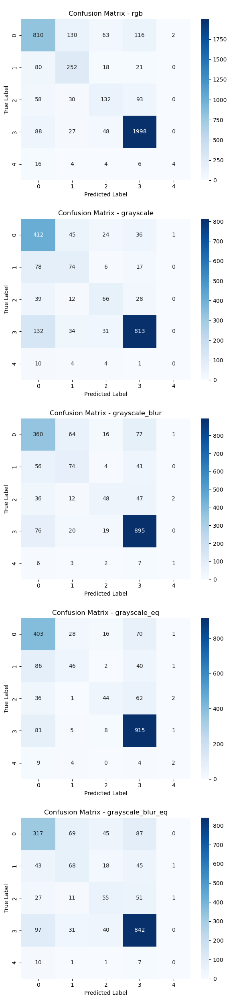

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

methods_list = list(results.keys())
num_methods = len(methods_list)

fig, axes = plt.subplots(nrows=num_methods, ncols=1, figsize=(6, 5 * num_methods))  # height * num_methods

if num_methods == 1:
    axes = [axes]  # ensure axes is iterable even if one plot

for ax, method in zip(axes, methods_list):
    cm = results[method]['confusion_matrix']
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
    ax.set_title(f"\nConfusion Matrix - {method}")
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

plt.tight_layout()
plt.show()

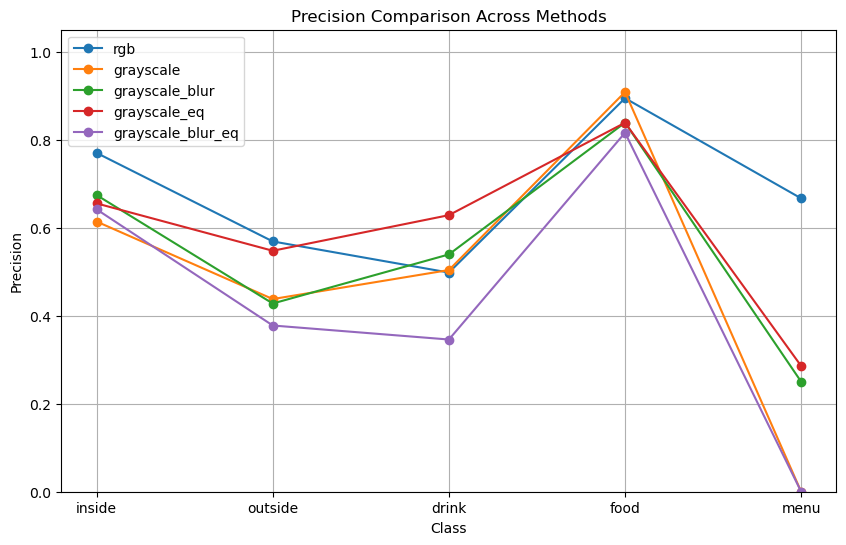

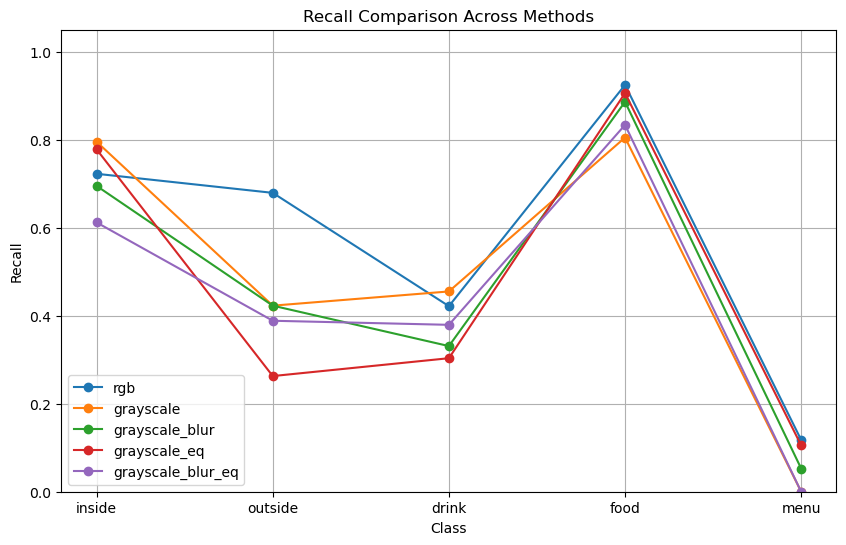

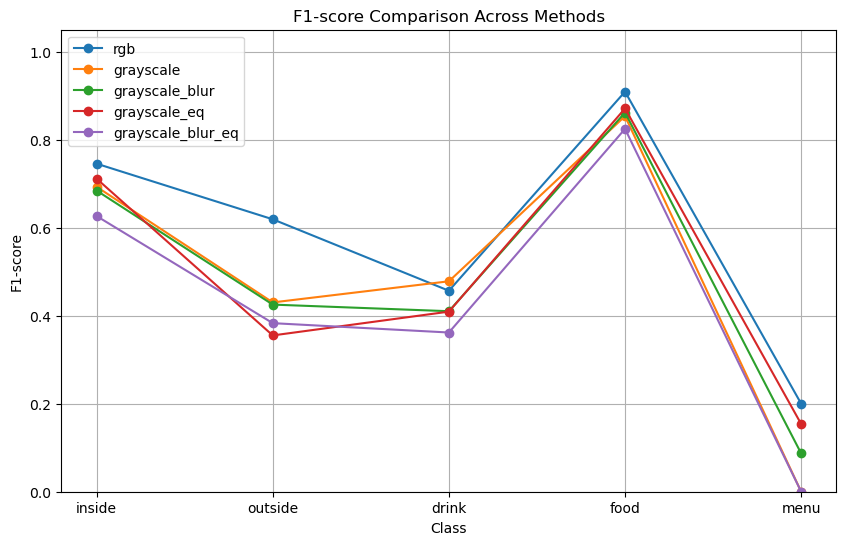

In [34]:
def plot_classification_metrics(report_dicts, label_names):
    metrics = ['precision', 'recall', 'f1-score']
    methods = list(report_dicts.keys())

    for metric in metrics:
        plt.figure(figsize=(10,6))
        for method in methods:
            values = [report_dicts[method][label][metric] for label in label_names]
            plt.plot(label_names, values, marker='o', label=method)
        plt.title(f'{metric.capitalize()} Comparison Across Methods')
        plt.ylabel(metric.capitalize())
        plt.xlabel('Class')
        plt.ylim(0, 1.05)
        plt.legend()
        plt.grid(True)
        plt.show()

# After running all models, call:
plot_classification_metrics(report_dicts, label_names=list(label_dict.keys()))

## Empirical Tuning

### Round 1

In [102]:
import numpy as np
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_auc_score,
    log_loss, balanced_accuracy_score, cohen_kappa_score,
    matthews_corrcoef, f1_score, recall_score, precision_score
)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization

In [39]:
print("\n=== Round 1: Baseline CNN ===")

model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')])


=== Round 1: Baseline CNN ===


In [41]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.sparse_top_k_categorical_accuracy])

In [43]:
history = model.fit(X_train, y_train, epochs=10, validation_split=0.2, batch_size=32, verbose=2)

Epoch 1/10
187/187 - 7s - 39ms/step - accuracy: 0.5634 - loss: 1.1020 - sparse_top_k_categorical_accuracy: 1.0000 - val_accuracy: 0.5964 - val_loss: 1.0377 - val_sparse_top_k_categorical_accuracy: 1.0000
Epoch 2/10
187/187 - 4s - 23ms/step - accuracy: 0.6518 - loss: 0.8982 - sparse_top_k_categorical_accuracy: 1.0000 - val_accuracy: 0.6539 - val_loss: 0.9106 - val_sparse_top_k_categorical_accuracy: 1.0000
Epoch 3/10
187/187 - 5s - 24ms/step - accuracy: 0.6976 - loss: 0.7964 - sparse_top_k_categorical_accuracy: 1.0000 - val_accuracy: 0.7008 - val_loss: 0.8244 - val_sparse_top_k_categorical_accuracy: 1.0000
Epoch 4/10
187/187 - 4s - 23ms/step - accuracy: 0.7504 - loss: 0.6719 - sparse_top_k_categorical_accuracy: 1.0000 - val_accuracy: 0.7028 - val_loss: 0.8430 - val_sparse_top_k_categorical_accuracy: 1.0000
Epoch 5/10
187/187 - 4s - 23ms/step - accuracy: 0.7929 - loss: 0.5442 - sparse_top_k_categorical_accuracy: 1.0000 - val_accuracy: 0.7135 - val_loss: 0.8389 - val_sparse_top_k_categoric

In [44]:
test_loss, test_acc, test_top3_acc = model.evaluate(X_test, y_test, verbose=0)
print(f"Round 1 Test Accuracy: {test_acc:.4f}")
print(f"Round 1 Test Top-3 Accuracy: {test_top3_acc:.4f}")

Round 1 Test Accuracy: 0.6872
Round 1 Test Top-3 Accuracy: 1.0000


In [45]:
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


In [46]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[317  65  26 110   0]
 [ 67  47   4  57   0]
 [ 29  13  45  57   1]
 [ 90  29  17 874   0]
 [  7   1   2   9   0]]


In [47]:
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=list(label_dict.keys())))

Classification Report:
              precision    recall  f1-score   support

      inside       0.62      0.61      0.62       518
     outside       0.30      0.27      0.28       175
       drink       0.48      0.31      0.38       145
        food       0.79      0.87      0.83      1010
        menu       0.00      0.00      0.00        19

    accuracy                           0.69      1867
   macro avg       0.44      0.41      0.42      1867
weighted avg       0.67      0.69      0.67      1867



In [53]:
y_test_cat = to_categorical(y_test, num_classes=num_classes)

In [55]:
print("\nAUC Scores:")
auc_scores = []
for i in range(num_classes):
    try:
        auc = roc_auc_score(y_test_cat[:, i], y_pred_probs[:, i])
        auc_scores.append(auc)
        print(f"Class {list(label_dict.keys())[i]} AUC: {auc:.3f}")
    except:
        auc_scores.append(None)
        print(f"Class {list(label_dict.keys())[i]} AUC: N/A")


AUC Scores:
Class inside AUC: 0.851
Class outside AUC: 0.785
Class drink AUC: 0.768
Class food AUC: 0.893
Class menu AUC: 0.717


In [66]:
logloss = log_loss(y_test, y_pred_probs)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
kappa = cohen_kappa_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
macro_f1 = f1_score(y_test, y_pred, average='macro')
weighted_f1 = f1_score(y_test, y_pred, average='weighted')
macro_recall = recall_score(y_test, y_pred, average='macro')  # Sensitivity
macro_precision = precision_score(y_test, y_pred, average='macro')

In [68]:
print("\nSpecificity per Class:")
specificity_per_class = []
for i in range(num_classes):
    tn = np.sum((y_test != i) & (y_pred != i))
    fp = np.sum((y_test != i) & (y_pred == i))
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    specificity_per_class.append(specificity)
    print(f"Class {list(label_dict.keys())[i]} Specificity: {specificity:.3f}")


Specificity per Class:
Class inside Specificity: 0.857
Class outside Specificity: 0.936
Class drink Specificity: 0.972
Class food Specificity: 0.728
Class menu Specificity: 0.999


In [70]:
print("\n=== Extended Metrics Summary ===")
print(f"Log Loss: {logloss:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")
print(f"Matthews Correlation Coefficient: {mcc:.4f}")
print(f"Macro F1-Score: {macro_f1:.4f}")
print(f"Weighted F1-Score: {weighted_f1:.4f}")
print(f"Macro Recall (Sensitivity): {macro_recall:.4f}")
print(f"Macro Precision: {macro_precision:.4f}")


=== Extended Metrics Summary ===
Log Loss: 1.9876
Balanced Accuracy: 0.4112
Cohen's Kappa: 0.4714
Matthews Correlation Coefficient: 0.4733
Macro F1-Score: 0.4208
Weighted F1-Score: 0.6737
Macro Recall (Sensitivity): 0.4112
Macro Precision: 0.4386


### Round 2 

In [73]:
print("\n=== Round 2: Add Dropout and tune optimizer ===")

model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_classes, activation='softmax')])


=== Round 2: Add Dropout and tune optimizer ===


In [75]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3)])

In [77]:
history = model.fit(X_train, y_train, epochs=15, validation_split=0.2, batch_size=32, verbose=2)

Epoch 1/15
187/187 - 8s - 43ms/step - accuracy: 0.5381 - loss: 1.1687 - sparse_top_k_categorical_accuracy: 0.9089 - val_accuracy: 0.5689 - val_loss: 1.1722 - val_sparse_top_k_categorical_accuracy: 0.9123
Epoch 2/15
187/187 - 6s - 31ms/step - accuracy: 0.5915 - loss: 1.0591 - sparse_top_k_categorical_accuracy: 0.9223 - val_accuracy: 0.6325 - val_loss: 0.9546 - val_sparse_top_k_categorical_accuracy: 0.9190
Epoch 3/15
187/187 - 6s - 32ms/step - accuracy: 0.6325 - loss: 0.9414 - sparse_top_k_categorical_accuracy: 0.9344 - val_accuracy: 0.6539 - val_loss: 0.9050 - val_sparse_top_k_categorical_accuracy: 0.9304
Epoch 4/15
187/187 - 6s - 33ms/step - accuracy: 0.6645 - loss: 0.8738 - sparse_top_k_categorical_accuracy: 0.9396 - val_accuracy: 0.6539 - val_loss: 0.8988 - val_sparse_top_k_categorical_accuracy: 0.9331
Epoch 5/15
187/187 - 6s - 33ms/step - accuracy: 0.6847 - loss: 0.8235 - sparse_top_k_categorical_accuracy: 0.9478 - val_accuracy: 0.6841 - val_loss: 0.8565 - val_sparse_top_k_categoric

In [78]:
test_loss, test_acc, test_top3_acc = model.evaluate(X_test, y_test, verbose=0)
print(f"Round 2 Test Accuracy: {test_acc:.4f}")
print(f"Round 2 Test Top-3 Accuracy: {test_top3_acc:.4f}")

Round 2 Test Accuracy: 0.7076
Round 2 Test Top-3 Accuracy: 0.9400


In [79]:
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


In [80]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[354  38  30  95   1]
 [ 67  51   7  50   0]
 [ 31  13  50  51   0]
 [ 90  19  35 866   0]
 [ 11   1   4   3   0]]


In [81]:
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=list(label_dict.keys())))

Classification Report:
              precision    recall  f1-score   support

      inside       0.64      0.68      0.66       518
     outside       0.42      0.29      0.34       175
       drink       0.40      0.34      0.37       145
        food       0.81      0.86      0.83      1010
        menu       0.00      0.00      0.00        19

    accuracy                           0.71      1867
   macro avg       0.45      0.44      0.44      1867
weighted avg       0.69      0.71      0.70      1867



In [82]:
y_test_cat = to_categorical(y_test, num_classes=num_classes)

In [83]:
auc_scores = []
for i in range(num_classes):
    try:
        auc = roc_auc_score(y_test_cat[:, i], y_pred_probs[:, i])
    except:
        auc = None
    auc_scores.append(auc)
    print(f"Class {list(label_dict.keys())[i]} AUC: {auc:.3f}" if auc is not None else f"Class {list(label_dict.keys())[i]} AUC: N/A")

Class inside AUC: 0.868
Class outside AUC: 0.801
Class drink AUC: 0.788
Class food AUC: 0.897
Class menu AUC: 0.726


In [84]:
logloss = log_loss(y_test, y_pred_probs)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
kappa = cohen_kappa_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
macro_f1 = f1_score(y_test, y_pred, average='macro')
weighted_f1 = f1_score(y_test, y_pred, average='weighted')
macro_recall = recall_score(y_test, y_pred, average='macro')
macro_precision = precision_score(y_test, y_pred, average='macro')

In [85]:
specificity_per_class = []
for i in range(num_classes):
    tn = np.sum((y_test != i) & (y_pred != i))
    fp = np.sum((y_test != i) & (y_pred == i))
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    specificity_per_class.append(specificity)
    print(f"Class {list(label_dict.keys())[i]} Specificity: {specificity:.3f}")

Class inside Specificity: 0.852
Class outside Specificity: 0.958
Class drink Specificity: 0.956
Class food Specificity: 0.768
Class menu Specificity: 0.999


In [86]:
print(f"Log Loss: {logloss:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")
print(f"Matthews Correlation Coefficient: {mcc:.4f}")
print(f"Macro F1-Score: {macro_f1:.4f}")
print(f"Weighted F1-Score: {weighted_f1:.4f}")
print(f"Macro Recall (Sensitivity): {macro_recall:.4f}")
print(f"Macro Precision: {macro_precision:.4f}")

Log Loss: 1.1320
Balanced Accuracy: 0.4354
Cohen's Kappa: 0.5108
Matthews Correlation Coefficient: 0.5120
Macro F1-Score: 0.4416
Weighted F1-Score: 0.6958
Macro Recall (Sensitivity): 0.4354
Macro Precision: 0.4536


In [87]:
### Round 3

In [98]:
print("\n=== Round 3: Add BatchNorm and Data Augmentation ===")
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)


=== Round 3: Add BatchNorm and Data Augmentation ===


In [104]:
# Build model with BatchNormalization
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

In [106]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003)
model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics=['accuracy',tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3)])

In [108]:
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    epochs=20,
    validation_data=(X_test, y_test),
    verbose=2)

Epoch 1/20


C:\Users\srida\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


234/234 - 18s - 78ms/step - accuracy: 0.4111 - loss: 1.8600 - sparse_top_k_categorical_accuracy: 0.7500 - val_accuracy: 0.2512 - val_loss: 1.6676 - val_sparse_top_k_categorical_accuracy: 0.7167
Epoch 2/20
234/234 - 14s - 60ms/step - accuracy: 0.5669 - loss: 1.2985 - sparse_top_k_categorical_accuracy: 0.8493 - val_accuracy: 0.5142 - val_loss: 1.4770 - val_sparse_top_k_categorical_accuracy: 0.8056
Epoch 3/20
234/234 - 15s - 63ms/step - accuracy: 0.6430 - loss: 1.0892 - sparse_top_k_categorical_accuracy: 0.8910 - val_accuracy: 0.6540 - val_loss: 1.0899 - val_sparse_top_k_categorical_accuracy: 0.8848
Epoch 4/20
234/234 - 14s - 62ms/step - accuracy: 0.6697 - loss: 0.9860 - sparse_top_k_categorical_accuracy: 0.9112 - val_accuracy: 0.6079 - val_loss: 1.2801 - val_sparse_top_k_categorical_accuracy: 0.8243
Epoch 5/20
234/234 - 14s - 60ms/step - accuracy: 0.6952 - loss: 0.9012 - sparse_top_k_categorical_accuracy: 0.9274 - val_accuracy: 0.7450 - val_loss: 0.7949 - val_sparse_top_k_categorical_acc

In [109]:
test_loss, test_acc, test_top3_acc = model.evaluate(X_test, y_test, verbose=0)
print(f"Round 3 Test Accuracy: {test_acc:.4f}")
print(f"Round 3 Test Top-3 Accuracy: {test_top3_acc:.4f}")

Round 3 Test Accuracy: 0.7574
Round 3 Test Top-3 Accuracy: 0.9529


In [110]:
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


In [111]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[478  18   4  17   1]
 [105  54   0  16   0]
 [ 66  11  36  30   2]
 [145  15   5 845   0]
 [ 16   0   0   2   1]]


In [112]:
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=list(label_dict.keys())))

Classification Report:
              precision    recall  f1-score   support

      inside       0.59      0.92      0.72       518
     outside       0.55      0.31      0.40       175
       drink       0.80      0.25      0.38       145
        food       0.93      0.84      0.88      1010
        menu       0.25      0.05      0.09        19

    accuracy                           0.76      1867
   macro avg       0.62      0.47      0.49      1867
weighted avg       0.78      0.76      0.74      1867



In [113]:
y_test_cat = to_categorical(y_test, num_classes=num_classes)

In [114]:
auc_scores = []
for i in range(num_classes):
    try:
        auc = roc_auc_score(y_test_cat[:, i], y_pred_probs[:, i])
    except:
        auc = None
    auc_scores.append(auc)
    print(f"Class {list(label_dict.keys())[i]} AUC: {auc:.3f}" if auc is not None else f"Class {list(label_dict.keys())[i]} AUC: N/A")

Class inside AUC: 0.925
Class outside AUC: 0.869
Class drink AUC: 0.870
Class food AUC: 0.956
Class menu AUC: 0.879


In [115]:
logloss = log_loss(y_test, y_pred_probs)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
kappa = cohen_kappa_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
macro_f1 = f1_score(y_test, y_pred, average='macro')
weighted_f1 = f1_score(y_test, y_pred, average='weighted')
macro_recall = recall_score(y_test, y_pred, average='macro')
macro_precision = precision_score(y_test, y_pred, average='macro')

In [116]:
specificity_per_class = []

for i in range(num_classes):
    tn = np.sum((y_test != i) & (y_pred != i))
    fp = np.sum((y_test != i) & (y_pred == i))
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    specificity_per_class.append(specificity)
    print(f"Class {list(label_dict.keys())[i]} Specificity: {specificity:.3f}")

Class inside Specificity: 0.754
Class outside Specificity: 0.974
Class drink Specificity: 0.995
Class food Specificity: 0.924
Class menu Specificity: 0.998


In [117]:
print(f"Log Loss: {logloss:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")
print(f"Matthews Correlation Coefficient: {mcc:.4f}")
print(f"Macro F1-Score: {macro_f1:.4f}")
print(f"Weighted F1-Score: {weighted_f1:.4f}")
print(f"Macro Recall (Sensitivity): {macro_recall:.4f}")
print(f"Macro Precision: {macro_precision:.4f}")

Log Loss: 0.6911
Balanced Accuracy: 0.4738
Cohen's Kappa: 0.6017
Matthews Correlation Coefficient: 0.6183
Macro F1-Score: 0.4923
Weighted F1-Score: 0.7433
Macro Recall (Sensitivity): 0.4738
Macro Precision: 0.6239
